In [2]:
#libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import warnings
warnings.filterwarnings('ignore')

print(" All libraries loaded!")

 All libraries loaded!


In [3]:
# load data
df = pd.read_csv('../data/songs.csv')  

print(f"Dataset shape: {df.shape}")
print(f"\nColumns: {df.columns.tolist()}")
df.head()

Dataset shape: (544401, 17)

Columns: ['Name', 'Id', 'Artists', 'Artists_Id', 'Release', 'Duration', 'Genre', 'Danceability', 'Energy', 'Key', 'Loudness', 'Speechiness', 'Acousticness', 'Instrumentalness', 'Liveness', 'Valeance', 'Tempo']


,Name,Id,Artists,Artists_Id,Release,Duration,Genre,Danceability,Energy,Key,Loudness,Speechiness,Acousticness,Instrumentalness,Liveness,Valeance,Tempo
0,Don't Go Yet,1058fW9H3fZA6QjYCdOBad,['Camila Cabello'],['4nDoRrQiYLoBzwC5BhVJzF'],2021-07-23,164842,pop,0.666,0.796,10,-6.967,0.1030,0.0492,0.000000,0.0442,0.6100,110.108
1,What A Time (feat. Niall Horan),5WtfUKzXircvW8l5aaVZWT,"['Julia Michaels', 'Niall Horan']","['0ZED1XzwlLHW4ZaG4lOT6m', '1Hsdzj7Dlq2I7tHP75...",2019-01-24,173307,pop,0.516,0.467,0,-6.184,0.0302,0.6620,0.000000,0.0853,0.3860,132.861
2,Scars To Your Beautiful,42ydLwx4i5V49RXHOozJZq,['Alessia Cara'],['2wUjUUtkb5lvLKcGKsKqsR'],2016-03-11,230227,pop,0.319,0.739,0,-5.740,0.2720,0.0285,0.000000,0.1110,0.4490,194.169
3,Reckless,5ajjAnNRh8bxFvaVHzpPjh,['Madison Beer'],['2kRfqPViCqYdSGhYSM9R0Q'],2021-06-04,203385,pop,0.386,0.426,3,-6.642,0.0363,0.8070,0.000000,0.1400,0.2610,180.104
4,Dusk Till Dawn (feat. Sia) - Radio Edit,3e7sxremeOE3wTySiOhGiP,"['ZAYN', 'Sia']","['5ZsFI1h6hIdQRw2ti0hz81', '5WUlDfRSoLAfcVSX1W...",2018-12-14,239000,pop,0.259,0.437,11,-6.589,0.0386,0.1020,0.000001,0.1060,0.0951,180.042


In [4]:
# getting info
print("Dataset Info:")
print(df.info())
print("\n" + "="*50)
print("Missing Values:")
print(df.isnull().sum())
print("\n" + "="*50)
print("Summary Statistics:")
print(df.describe())

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 544401 entries, 0 to 544400
Data columns (total 17 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Name              544385 non-null  object 
 1   Id                544401 non-null  object 
 2   Artists           544401 non-null  object 
 3   Artists_Id        544401 non-null  object 
 4   Release           544378 non-null  object 
 5   Duration          544401 non-null  int64  
 6   Genre             544401 non-null  object 
 7   Danceability      544401 non-null  float64
 8   Energy            544401 non-null  float64
 9   Key               544401 non-null  int64  
 10  Loudness          544401 non-null  float64
 11  Speechiness       544401 non-null  float64
 12  Acousticness      544401 non-null  float64
 13  Instrumentalness  544401 non-null  float64
 14  Liveness          544401 non-null  float64
 15  Valeance          544401 non-null  float64
 16  Tempo 

In [5]:
# handle missing values
print("Missing values before cleaning:")
print(df.isnull().sum())

#drop rows with missing features
df = df.dropna(subset=['Name', 'Release'])

#fix typo 
df = df.rename(columns={'Valeance': 'Valence'})

print(f"\nDataset shape after cleaning: {df.shape}")
print(" Data cleaned!")

Missing values before cleaning:
Name                16
Id                   0
Artists              0
Artists_Id           0
Release             23
Duration             0
Genre                0
Danceability         0
Energy               0
Key                  0
Loudness             0
Speechiness          0
Acousticness         0
Instrumentalness     0
Liveness             0
Valeance             0
Tempo                0
dtype: int64

Dataset shape after cleaning: (544362, 17)
 Data cleaned!


In [6]:
# genre geolocation 
import pandas as pd
import numpy as np
import re
import plotly.express as px

#load original data
df_geo = pd.read_csv('../data/songs.csv')
df_geo = df_geo.dropna(subset=['Genre'])

if 'Valeance' in df_geo.columns:
    df_geo = df_geo.rename(columns={'Valeance': 'Valence'})

# define list for countries
country_keywords = {
    "Argentina": ["argentinian"],
    "Australia": ["australian"],
    "Austria": ["austrian"],
    "Belgium": ["belgian"],
    "Brazil": ["brazilian"],
    "Canada": ["canadian"],
    "Chile": ["chilean"],
    "China": ["chinese"],
    "Colombia": ["colombian"],
    "Cuba": ["cuban"],
    "Denmark": ["danish"],
    "Egypt": ["egyptian"],
    "Finland": ["finnish"],
    "France": ["french"],
    "Germany": ["german"],
    "Greece": ["greek"],
    "India": ["indian"],
    "Indonesia": ["indonesian"],
    "Iran": ["iranian", "persian"],
    "Ireland": ["irish"],
    "Israel": ["israeli"],
    "Italy": ["italian"],
    "Jamaica": ["jamaican"],
    "Japan": ["japanese"],
    "Kenya": ["kenyan"],
    "Mexico": ["mexican"],
    "Morocco": ["moroccan"],
    "Netherlands": ["dutch"],
    "New Zealand": ["new zealand", "kiwi"],
    "Nigeria": ["nigerian"],
    "Norway": ["norwegian"],
    "Pakistan": ["pakistani"],
    "Peru": ["peruvian"],
    "Philippines": ["filipino", "philippine"],
    "Poland": ["polish"],
    "Portugal": ["portuguese"],
    "Russia": ["russian"],
    "South Africa": ["south african"],
    "South Korea": ["korean", "k-pop"],
    "Spain": ["spanish"],
    "Sweden": ["swedish"],
    "Switzerland": ["swiss"],
    "Thailand": ["thai"],
    "Turkey": ["turkish"],
    "Ukraine": ["ukrainian"],
    "United Kingdom": ["uk", "british", "english", "scottish", "welsh"],
    "Romania": ["romanian"],
    "Bulgaria": ["bulgarian"],
    "Hungary": ["hungarian"],
    "United States": ["american", "usa", "us", "u.s."],
    "Venezuela": ["venezuelan"],
    "Serbia": ["serbian"],
    "Vietnam": ["vietnamese"]
}

# extract country from genre string
def detect_country(genre):
    genre_lower = genre.lower()
    for country, keywords in country_keywords.items():
        for kw in keywords:
            if kw in genre_lower:
                return country
    return None

#detection
df_geo['Country'] = df_geo['Genre'].apply(detect_country)

#aggregate count
country_counts = df_geo['Country'].value_counts().reset_index()
country_counts.columns = ['Country', 'Genre_Count']

#top 10 countries
top10 = country_counts.head(10)
print("\n Top 10 Countries by Genre Mentions:\n")
print(top10.to_string(index=False))

#plot map
fig = px.choropleth(country_counts,
                    locations="Country",
                    locationmode="country names",
                    color="Genre_Count",
                    color_continuous_scale="Viridis",
                    title=" Number of Genre Mentions per Country")

fig.update_layout(geo=dict(showframe=False, showcoastlines=False))
fig.show()



 Top 10 Countries by Genre Mentions:

       Country  Genre_Count
 United States        38046
United Kingdom        10860
         Italy         8012
         Japan         7384
       Germany         7101
        Russia         6343
        Sweden         6121
        Mexico         5112
        Canada         4798
        Brazil         4497


In [7]:
#classifiers
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
import pickle
import warnings
import psutil
import gc
warnings.filterwarnings('ignore')

#load data
df = pd.read_csv('../data/songs.csv')
df = df.dropna(subset=['Name', 'Release'])
df = df.rename(columns={'Valeance': 'Valence'})

#audio features
audio_features = ['Danceability', 'Energy', 'Loudness', 'Speechiness', 
                  'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo']

print("=" * 70)
print("MAXIMUM GENRE COVERAGE STRATEGY")
print("=" * 70)

#Sample songs per genre to maximize coverage

genre_counts = df['Genre'].value_counts()

#configuration 
MAX_SONGS_PER_GENRE = 200      # increase genre diversity
MIN_SONGS_PER_GENRE = 30       # minimum songs needed for reliable training
TARGET_TOTAL_SONGS = 80000     # target total dataset size 

#available memory
available_memory_gb = psutil.virtual_memory().available / (1024**3)
print(f"\nAvailable RAM: {available_memory_gb:.1f} GB")

#adjust target based on available memory
if available_memory_gb < 4:
    TARGET_TOTAL_SONGS = 40000
    print(" Low memory detected - reducing to 40k songs")
elif available_memory_gb < 8:
    TARGET_TOTAL_SONGS = 60000
    print("Medium memory - using 60k songs")
else:
    TARGET_TOTAL_SONGS = 100000
    print("Good memory - using 100k songs")

print(f"\nStrategy Configuration:")
print(f"  - Max songs per genre: {MAX_SONGS_PER_GENRE}")
print(f"  - Min songs per genre: {MIN_SONGS_PER_GENRE}")
print(f"  - Target total songs: {TARGET_TOTAL_SONGS:,}")

#filter genres with min songs
valid_genres = genre_counts[genre_counts >= MIN_SONGS_PER_GENRE].index
print(f"\nGenres with {MIN_SONGS_PER_GENRE}+ songs: {len(valid_genres)}")

#sample from each genre
sampled_dfs = []
total_sampled = 0

for genre in valid_genres:
    genre_df = df[df['Genre'] == genre]
    n_songs = len(genre_df)
    
    #sample up to MAX_SONGS_PER_GENRE from this genre
    sample_size = min(n_songs, MAX_SONGS_PER_GENRE)
    
    #stop if we reached our target total
    if total_sampled + sample_size > TARGET_TOTAL_SONGS:
        sample_size = TARGET_TOTAL_SONGS - total_sampled
        if sample_size < MIN_SONGS_PER_GENRE:
            break
    
    sampled = genre_df.sample(n=sample_size, random_state=42)
    sampled_dfs.append(sampled)
    total_sampled += sample_size
    
    if total_sampled >= TARGET_TOTAL_SONGS:
        break

#combine all sampled data
df_filtered = pd.concat(sampled_dfs, ignore_index=True)

#clean up memory
del sampled_dfs
gc.collect()

print(f"\n" + "=" * 70)
print(f"FINAL DATASET:")
print(f"=" * 70)
print(f"Total songs: {len(df_filtered):,}")
print(f"Number of genres: {df_filtered['Genre'].nunique()}")
print(f"\nGenre distribution:")
final_genre_counts = df_filtered['Genre'].value_counts()
print(f"  - Min songs per genre: {final_genre_counts.min()}")
print(f"  - Max songs per genre: {final_genre_counts.max()}")
print(f"  - Median songs per genre: {final_genre_counts.median():.0f}")
print(f"  - Mean songs per genre: {final_genre_counts.mean():.0f}")

#prepare features 
X = df_filtered[audio_features].copy()

#add engineered features for better accuracy
X['Energy_x_Danceability'] = X['Energy'] * X['Danceability']
X['Loudness_x_Energy'] = X['Loudness'] * X['Energy']
X['Acousticness_x_Instrumentalness'] = X['Acousticness'] * X['Instrumentalness']
X['Valence_x_Danceability'] = X['Valence'] * X['Danceability']
X['Energy_squared'] = X['Energy'] ** 2
X['Tempo_normalized'] = X['Tempo'] / 250.0

y = df_filtered['Genre']

#encode labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

#split data
try:
    X_train, X_test, y_train, y_test = train_test_split(
        X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
    )
except ValueError:
    X_train, X_test, y_train, y_test = train_test_split(
        X, y_encoded, test_size=0.2, random_state=42
    )

#scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#clean up
del X, y, df_filtered
gc.collect()

print(f"\nTraining set: {X_train.shape[0]:,} songs")
print(f"Test set: {X_test.shape[0]:,} songs")

#train random forest with optim settings for max genres
print("\n" + "=" * 70)
print("TRAINING MODEL (this will take 3-8 minutes)...")
print("=" * 70)

model = RandomForestClassifier(
    n_estimators=150,        
    max_depth=18,            
    max_features='sqrt',     
    min_samples_split=15,    #prevent overfitting with many genres
    min_samples_leaf=5,      #ensure leaf nodes have enough samples
    random_state=42,
    n_jobs=2,                
    verbose=2,               #show progress
    max_samples=0.7,         #use 70% of data per tree (saves memory)
    bootstrap=True
)

try:
    model.fit(X_train_scaled, y_train)
    accuracy = model.score(X_test_scaled, y_test)
    
    print(f"\n" + "=" * 70)
    print(f" TRAINING COMPLETE!")
    print(f"=" * 70)
    print(f"Test Accuracy: {accuracy*100:.2f}%")
    print(f"Random baseline: {100/len(label_encoder.classes_):.2f}%")
    print(f"Improvement over random: {accuracy/(1/len(label_encoder.classes_)):.1f}x better")
    
    #save model
    import os
    os.makedirs('../models', exist_ok=True)
    
    with open('../models/genre_classifier.pkl', 'wb') as f:
        pickle.dump(model, f)
    
    with open('../models/scaler.pkl', 'wb') as f:
        pickle.dump(scaler, f)
    
    with open('../models/label_encoder.pkl', 'wb') as f:
        pickle.dump(label_encoder, f)
    
    print("\n Model saved successfully!")
    print(f"\nThis model can predict {len(label_encoder.classes_)} different genres!")
    
    print("\nTop 30 genres in model:")
    sorted_genres = sorted(final_genre_counts.head(30).items(), key=lambda x: -x[1])
    for i, (genre, count) in enumerate(sorted_genres, 1):
        print(f"  {i:2d}. {genre:40s} {count:4d} songs")
    
    if len(label_encoder.classes_) > 30:
        print(f"  ... and {len(label_encoder.classes_) - 30} more genres")

except MemoryError as e:
    print("\n" + "=" * 70)
    print(" MEMORY ERROR!")
    print("=" * 70)
    print("Try reducing these parameters at the top of the script:")
    print(f"  - TARGET_TOTAL_SONGS from {TARGET_TOTAL_SONGS:,} to {TARGET_TOTAL_SONGS//2:,}")
    print(f"  - MAX_SONGS_PER_GENRE from {MAX_SONGS_PER_GENRE} to {MAX_SONGS_PER_GENRE//2}")
    print("\nOr close other programs and try again!")
    raise

print("\n" + "=" * 70)
print("RECOMMENDATIONS FOR EVEN MORE GENRES:")
print("=" * 70)
print("If this worked, you can try increasing:")
print("  1. MAX_SONGS_PER_GENRE to 300 (more data per genre)")
print("  2. TARGET_TOTAL_SONGS to 120000 (if you have RAM)")
print("\nIf you got memory error, decrease both parameters by 25-50%")


MAXIMUM GENRE COVERAGE STRATEGY

Available RAM: 1.0 GB
 Low memory detected - reducing to 40k songs

Strategy Configuration:
  - Max songs per genre: 200
  - Min songs per genre: 30
  - Target total songs: 40,000

Genres with 30+ songs: 5563

FINAL DATASET:
Total songs: 40,000
Number of genres: 400

Genre distribution:
  - Min songs per genre: 100
  - Max songs per genre: 100
  - Median songs per genre: 100
  - Mean songs per genre: 100

Training set: 32,000 songs
Test set: 8,000 songs

TRAINING MODEL (this will take 3-8 minutes)...
building tree 2 of 150
building tree 1 of 150


[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.


building tree 3 of 150
building tree 4 of 150
building tree 5 of 150
building tree 6 of 150
building tree 7 of 150
building tree 8 of 150
building tree 9 of 150
building tree 10 of 150
building tree 11 of 150
building tree 12 of 150
building tree 13 of 150
building tree 14 of 150
building tree 15 of 150
building tree 16 of 150
building tree 17 of 150
building tree 18 of 150
building tree 19 of 150
building tree 20 of 150
building tree 21 of 150
building tree 22 of 150
building tree 23 of 150
building tree 24 of 150
building tree 25 of 150
building tree 26 of 150
building tree 27 of 150
building tree 28 of 150
building tree 29 of 150
building tree 30 of 150
building tree 31 of 150
building tree 32 of 150
building tree 33 of 150
building tree 34 of 150
building tree 35 of 150
building tree 36 of 150
building tree 37 of 150
building tree 38 of 150
building tree 39 of 150
building tree 40 of 150


[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:   10.8s


building tree 41 of 150
building tree 42 of 150
building tree 43 of 150
building tree 44 of 150
building tree 45 of 150
building tree 46 of 150
building tree 47 of 150
building tree 48 of 150
building tree 49 of 150
building tree 50 of 150
building tree 51 of 150
building tree 52 of 150
building tree 53 of 150
building tree 54 of 150
building tree 55 of 150
building tree 56 of 150
building tree 57 of 150
building tree 58 of 150
building tree 59 of 150
building tree 60 of 150
building tree 61 of 150
building tree 62 of 150
building tree 63 of 150
building tree 64 of 150
building tree 65 of 150
building tree 66 of 150
building tree 67 of 150
building tree 68 of 150
building tree 69 of 150
building tree 70 of 150
building tree 71 of 150
building tree 72 of 150
building tree 73 of 150
building tree 74 of 150
building tree 75 of 150
building tree 76 of 150
building tree 77 of 150
building tree 78 of 150
building tree 79 of 150
building tree 80 of 150
building tree 81 of 150
building tree 82

[Parallel(n_jobs=2)]: Done 150 out of 150 | elapsed:   43.6s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.4s
[Parallel(n_jobs=2)]: Done 150 out of 150 | elapsed:    1.6s finished



 TRAINING COMPLETE!
Test Accuracy: 10.41%
Random baseline: 0.25%
Improvement over random: 41.6x better

 Model saved successfully!

This model can predict 400 different genres!

Top 30 genres in model:
   1. pop                                       100 songs
   2. korean worship                            100 songs
   3. dutch moombahton                          100 songs
   4. malaysian tamil pop                       100 songs
   5. brazilian modern jazz                     100 songs
   6. dub punk                                  100 songs
   7. festigal                                  100 songs
   8. detskie pesni                             100 songs
   9. dallas indie                              100 songs
  10. rap underground colombiano                100 songs
  11. greek guitar                              100 songs
  12. experimental jazz                         100 songs
  13. disney portugues brasil                   100 songs
  14. ottawa indie                         

In [8]:

# hierarchy and parents genres builder


import pandas as pd
import numpy as np
from collections import Counter
import re

print("=" * 80)
print("SMART GENRE HIERARCHY BUILDER")
print("=" * 80)

#load data
df = pd.read_csv('../data/songs.csv')
df = df.dropna(subset=['Name', 'Release'])
if 'Valeance' in df.columns:
    df = df.rename(columns={'Valeance': 'Valence'})

print(f"\n Dataset: {len(df):,} songs across {df['Genre'].nunique():,} genres")

#get genre counts
genre_counts = df['Genre'].value_counts()


#parent genre extraction

def extract_parent_genre_smart(genre_name):
    """
    Extract parent genres using keyword matching.
    Prioritizes specific genres before general ones.
    """
    genre_lower = genre_name.lower().strip()
    
    #tier 1:very specific subgenres 
    specific_genres = {
        #metal 
        'black metal': ['black metal'],
        'death metal': ['death metal'],
        'doom metal': ['doom metal'],
        'thrash metal': ['thrash metal'],
        'power metal': ['power metal'],
        'metalcore': ['metalcore'],
        'deathcore': ['deathcore'],
        'grindcore': ['grindcore'],
        
        #electronic 
        'techno': ['techno'],
        'house': ['house'],
        'trance': ['trance'],
        'dubstep': ['dubstep'],
        'drum and bass': ['drum and bass', 'dnb', 'drum n bass'],
        'ambient': ['ambient'],
        'edm': ['edm'],
        'electro': ['electro'],
        
        #rock 
        'punk': ['punk'],
        'grunge': ['grunge'],
        'emo': ['emo'],
        'screamo': ['screamo'],
        
        #hip hop 
        'trap': ['trap'],
        'drill': ['drill'],
        'grime': ['grime'],
        
        #latin 
        'reggaeton': ['reggaeton'],
        'salsa': ['salsa'],
        'bachata': ['bachata'],
        'cumbia': ['cumbia'],
        'merengue': ['merengue'],
        
        #caribbean
        'reggae': ['reggae'],
        'dancehall': ['dancehall'],
        'ska': ['ska'],
        
        #pop 
        'k-pop': ['k-pop', 'kpop'],
        'j-pop': ['j-pop', 'jpop'],
    }
    
    #check specific genres first
    for parent, keywords in specific_genres.items():
        for keyword in keywords:
            if keyword in genre_lower:
                return parent
    
    #tier 2:general parent genres 
    general_genres = {
        'metal': ['metal'],
        'rock': ['rock'],
        'hip hop': ['hip hop', 'hip-hop', 'hiphop', 'rap'],
        'pop': ['pop'],
        'electronic': ['electronic'],
        'jazz': ['jazz'],
        'blues': ['blues'],
        'classical': ['classical', 'baroque', 'opera', 'symphony'],
        'country': ['country', 'bluegrass'],
        'folk': ['folk'],
        'r&b': ['r&b', 'rnb', 'r and b'],
        'soul': ['soul'],
        'funk': ['funk'],
        'gospel': ['gospel'],
        'latin': ['latin', 'latino', 'latina'],
        'indie': ['indie'],
        'alternative': ['alternative', 'alt'],
    }
    
    for parent, keywords in general_genres.items():
        for keyword in keywords:
            if keyword in genre_lower:
                return parent
    
    #tier 3:extract from geographic/language markers
    #if genre has country/language prefix, use the main genre after it
    words = genre_lower.split()
    if len(words) >= 2:
        last_word = words[-1]
        #check if last word is a known genre
        for parent, keywords in {**specific_genres, **general_genres}.items():
            if last_word in keywords:
                return parent
    
    #tier 4:fallback - use last word or return as-is for unique genres
    return words[-1] if len(words) > 1 else genre_lower


#apply hierarchy

print("\n Analyzing all genres and extracting parent categories...")
df['parent_genre'] = df['Genre'].apply(extract_parent_genre_smart)

#analyze results
parent_counts = df['parent_genre'].value_counts()
print(f"\n Hierarchy Created!")
print(f"   Parent genres found: {df['parent_genre'].nunique()}")
print(f"   Original subgenres: {df['Genre'].nunique()}")


#top 30 parent genres

print(f"\n{'='*80}")
print(f"TOP 30 PARENT GENRES")
print(f"{'='*80}")
print(f"{'Rank':<6}{'Parent Genre':<25}{'Songs':<15}{'Subgenres':<12}{'% Dataset'}")
print(f"{'-'*80}")

for i, (parent, count) in enumerate(parent_counts.head(30).items(), 1):
    subgenre_count = df[df['parent_genre'] == parent]['Genre'].nunique()
    percentage = (count / len(df)) * 100
    print(f"{i:<6}{parent:<25}{count:>12,}  {subgenre_count:>10}  {percentage:>10.2f}%")


print(f"\n{'='*80}")
print(f"EXAMPLE SUBGENRE MAPPINGS (Top 10 Parents)")
print(f"{'='*80}")

for parent in parent_counts.head(10).index:
    subgenres = df[df['parent_genre'] == parent]['Genre'].value_counts().head(8)
    print(f"\n {parent.upper()} ({parent_counts[parent]:,} songs)")
    print(f"   Top subgenres:")
    for subgenre, count in subgenres.items():
        print(f"      • {subgenre:<40} ({count:>6,} songs)")
    remaining = df[df['parent_genre'] == parent]['Genre'].nunique() - 8
    if remaining > 0:
        print(f"      ... and {remaining} more subgenres")

#reccomandations


print(f"\n{'='*80}")
print(f" RECOMMENDATIONS FOR TRAINING")
print(f"{'='*80}")

#find parents with good balance (enough songs, enough subgenres)
good_parents = []
for parent in parent_counts.index:
    song_count = parent_counts[parent]
    subgenre_count = df[df['parent_genre'] == parent]['Genre'].nunique()
    
    #criteria: 1000+ songs, 5+ subgenres
    if song_count >= 1000 and subgenre_count >= 5:
        good_parents.append((parent, song_count, subgenre_count))

print(f"\n RECOMMENDED PARENT GENRES FOR HIERARCHICAL TRAINING:")
print(f"   (These have 1000+ songs and 5+ subgenres)\n")

for i, (parent, songs, subgenres) in enumerate(good_parents[:20], 1):
    print(f"   {i:2d}. {parent:<20} {songs:>7,} songs, {subgenres:>3} subgenres")


# save hierarchy


print(f"\n Saving hierarchy to file...")

#save parent genre mapping
hierarchy_df = df[['Genre', 'parent_genre']].drop_duplicates()
hierarchy_df = hierarchy_df.merge(
    genre_counts.reset_index().rename(columns={'Genre': 'genre_orig', 'count': 'song_count'}),
    left_on='Genre',
    right_on='genre_orig'
).drop('genre_orig', axis=1)

hierarchy_df.to_csv('../data/genre_hierarchy.csv', index=False)

#save recommended parent list
with open('../data/recommended_parents.txt', 'w') as f:
    f.write("RECOMMENDED PARENT GENRES FOR TRAINING\n")
    f.write("="*60 + "\n\n")
    for parent, songs, subgenres in good_parents[:20]:
        f.write(f"{parent}: {songs:,} songs, {subgenres} subgenres\n")

print("Saved to:")
print("   • ../data/genre_hierarchy.csv")
print("   • ../data/recommended_parents.txt")

print(f"\n{'='*80}")
print(f" HIERARCHY ANALYSIS COMPLETE!")
print(f"{'='*80}")
print(f"\nNEXT STEPS:")
print(f"1. Review the recommended parent genres above")
print(f"2. Run CELL 8 to train Level 1 (parent classifier)")
print(f"3. Modify 'selected_parents' list in Cell 6.2 with your choices")
print(f"\nSUGGESTED CONFIGURATION:")
print(f"   Use top 15-20 parents from recommended list")
print(f"   This covers ~80% of your dataset with good subgenre diversity")

SMART GENRE HIERARCHY BUILDER

 Dataset: 544,362 songs across 5,570 genres

 Analyzing all genres and extracting parent categories...

 Hierarchy Created!
   Parent genres found: 1342
   Original subgenres: 5570

TOP 30 PARENT GENRES
Rank  Parent Genre             Songs          Subgenres   % Dataset
--------------------------------------------------------------------------------
1     pop                            41,051         417        7.54%
2     indie                          40,375         411        7.42%
3     rock                           37,218         379        6.84%
4     hip hop                        35,038         355        6.44%
5     metal                          19,818         204        3.64%
6     punk                           16,647         169        3.06%
7     folk                           15,895         164        2.92%
8     classical                      14,881         157        2.73%
9     jazz                           13,107         134        2.

In [9]:

#train lvl 1

print("\n\n" + "=" * 80)
print("CELL 8: TRAIN LEVEL 1 (PARENT GENRE CLASSIFIER)")
print("=" * 80)

#config
#option 1:top N parent genres
#USE_TOP_N = 12  

#option 2:manually specify parent genres 
selected_parents = ['rock', 'pop', 'hip hop', 'electro', 'metal', 'jazz', 
                     'indie', 'punk', 'country', 'latin', 'folk', 'classical',
                     'house', 'trap', 'black metal', 'techno', 'reggae', 'hardcore', 
                     'ska', 'emo', 'alternative']


#selected_parents = parent_counts.head(USE_TOP_N).index.tolist()

print(f"\n SELECTED PARENT GENRES FOR TRAINING ({len(selected_parents)}):")
print("=" * 80)
for i, parent in enumerate(selected_parents, 1):
    count = parent_counts[parent]
    subgenres = df[df['parent_genre'] == parent]['Genre'].nunique()
    print(f"{i:2d}. {parent:25s} {count:>7,} songs, {subgenres:>4} subgenres")

#filter to selected parents
df_train = df[df['parent_genre'].isin(selected_parents)].copy()

print(f"\n Training Dataset:")
print(f"Total songs: {len(df_train):,} ({len(df_train)/len(df)*100:.1f}% of full dataset)")
print(f"Parent genres: {df_train['parent_genre'].nunique()}")
print(f"Total subgenres: {df_train['Genre'].nunique()}")
print(f"Memory: {df_train.memory_usage(deep=True).sum() / 1024**2:.1f} MB")

#free original dataframe
del df
gc.collect()

#prepare features with engineering

print(f"\n Engineering features...")

X = df_train[audio_features].copy()

#add engineered features
X['Energy_x_Danceability'] = X['Energy'] * X['Danceability']
X['Loudness_x_Energy'] = X['Loudness'] * X['Energy']
X['Acousticness_x_Instrumentalness'] = X['Acousticness'] * X['Instrumentalness']
X['Valence_x_Danceability'] = X['Valence'] * X['Danceability']
X['Energy_squared'] = X['Energy'] ** 2
X['Tempo_normalized'] = X['Tempo'] / 250.0

y_parent = df_train['parent_genre']

print(f"Features: {len(X.columns)} total ({len(audio_features)} base + {len(X.columns) - len(audio_features)} engineered)")


#encode and split
print(f"\n Preparing training/test split...")

label_encoder_parent = LabelEncoder()
y_parent_encoded = label_encoder_parent.fit_transform(y_parent)

X_train_p, X_test_p, y_train_p, y_test_p, idx_train, idx_test = train_test_split(
    X, y_parent_encoded, df_train.index, 
    test_size=0.2, 
    random_state=42, 
    stratify=y_parent_encoded
)

print(f"Training samples: {len(X_train_p):,}")
print(f"Test samples: {len(X_test_p):,}")


#scale features

print(f"\n Scaling features...")

scaler_parent = StandardScaler()
X_train_p_scaled = scaler_parent.fit_transform(X_train_p)
X_test_p_scaled = scaler_parent.transform(X_test_p)

#train random forest (lvl 1)

print(f"\n Training Random Forest (Parent Genre Classifier)...")
print(f"This may take a few minutes...")

model_parent = RandomForestClassifier(
    n_estimators=100,  
    max_depth=20,      
    random_state=42,
    n_jobs=-1,         #use all CPU cores
    min_samples_split=5,
    verbose=1
)

model_parent.fit(X_train_p_scaled, y_train_p)

#evaluate
accuracy_parent = model_parent.score(X_test_p_scaled, y_test_p)

print(f"\n LEVEL 1 TRAINING COMPLETE!")
print("=" * 80)
print(f"Parent Genre Accuracy: {accuracy_parent*100:.2f}%")
print(f"Random baseline: {100/len(label_encoder_parent.classes_):.2f}%")
print(f"Improvement: {(accuracy_parent*len(label_encoder_parent.classes_)):.1f}x better than random")

#show per-class accuracy
print(f"\n Per-Parent Accuracy:")
from sklearn.metrics import classification_report
y_pred = model_parent.predict(X_test_p_scaled)
report = classification_report(y_test_p, y_pred, target_names=label_encoder_parent.classes_, output_dict=True)

for parent in sorted(label_encoder_parent.classes_):
    if parent in report:
        acc = report[parent]['precision']
        print(f"  {parent:25s}: {acc*100:5.1f}%")

# save lvl 1 model
print(f"\n Saving Level 1 model...")
import os
os.makedirs('../models/hierarchical', exist_ok=True)

with open('../models/hierarchical/parent_model.pkl', 'wb') as f:
    pickle.dump(model_parent, f)
with open('../models/hierarchical/parent_scaler.pkl', 'wb') as f:
    pickle.dump(scaler_parent, f)
with open('../models/hierarchical/parent_encoder.pkl', 'wb') as f:
    pickle.dump(label_encoder_parent, f)

print(" Level 1 model saved!")

#free memory before next cell
del X_train_p_scaled
gc.collect()

print("\n" + "=" * 80)
print(" CELL 8 COMPLETE!")
print("=" * 80)
print(f"\nNext: Run CELL 9 to train Level 2 (subgenre classifiers)")




CELL 8: TRAIN LEVEL 1 (PARENT GENRE CLASSIFIER)

 SELECTED PARENT GENRES FOR TRAINING (21):
 1. rock                       37,218 songs,  379 subgenres
 2. pop                        41,051 songs,  417 subgenres
 3. hip hop                    35,038 songs,  355 subgenres
 4. electro                    10,411 songs,  106 subgenres
 5. metal                      19,818 songs,  204 subgenres
 6. jazz                       13,107 songs,  134 subgenres
 7. indie                      40,375 songs,  411 subgenres
 8. punk                       16,647 songs,  169 subgenres
 9. country                     3,944 songs,   40 subgenres
10. latin                       1,895 songs,   19 subgenres
11. folk                       15,895 songs,  164 subgenres
12. classical                  14,881 songs,  157 subgenres
13. house                       8,816 songs,   89 subgenres
14. trap                        6,373 songs,   64 subgenres
15. black metal                 5,933 songs,   63 subgenres
16. te

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:   15.7s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.3s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s



 LEVEL 1 TRAINING COMPLETE!
Parent Genre Accuracy: 15.79%
Random baseline: 4.76%
Improvement: 3.3x better than random

 Per-Parent Accuracy:


[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.3s finished


  alternative              :   5.9%
  black metal              :   8.1%
  classical                :  16.5%
  country                  :  22.0%
  electro                  :  13.5%
  emo                      :   6.1%
  folk                     :  12.9%
  hardcore                 :   4.1%
  hip hop                  :  16.8%
  house                    :   5.2%
  indie                    :  16.4%
  jazz                     :  15.6%
  latin                    :  38.1%
  metal                    :  12.2%
  pop                      :  15.8%
  punk                     :   9.4%
  reggae                   :  17.8%
  rock                     :  14.9%
  ska                      :   3.7%
  techno                   :   4.2%
  trap                     :  11.5%

 Saving Level 1 model...
 Level 1 model saved!

 CELL 8 COMPLETE!

Next: Run CELL 9 to train Level 2 (subgenre classifiers)


In [11]:

#train lvl 2 (subgenres)

print("\n\n" + "=" * 80)
print("CELL 9: TRAIN LEVEL 2 (SUBGENRE CLASSIFIERS)")
print("=" * 80)

level2_models = {}
level2_scalers = {}
level2_encoders = {}
level2_accuracies = {}
feature_cols = X.columns.tolist()

print(f"\n Training specialized classifiers for each parent genre...")
print(f"Total parent genres: {len(selected_parents)}\n")

for parent_idx, parent_genre in enumerate(sorted(selected_parents), 1):
    print(f"\n{'='*80}")
    print(f"[{parent_idx}/{len(selected_parents)}] Processing: {parent_genre}")
    print(f"{'='*80}")
    
    df_parent = df_train[df_train['parent_genre'] == parent_genre].copy()
    subgenres = df_parent['Genre'].unique()
    
    #skip if only 1 subgenre
    if len(subgenres) < 2:
        print(f"  Only 1 subgenre - skipping (no classification needed)")
        continue
    
    # skip if too few samples
    if len(df_parent) < 100:
        print(f" Only {len(df_parent)} songs - skipping (need ≥100)")
        continue
    
    print(f" Stats: {len(subgenres)} subgenres, {len(df_parent):,} songs")
    print(f"   Top subgenres: {', '.join(df_parent['Genre'].value_counts().head(5).index.tolist())}")
    
    #prepare features (same as lvl 1)
    X_sub = df_parent[audio_features].copy()
    X_sub['Energy_x_Danceability'] = X_sub['Energy'] * X_sub['Danceability']
    X_sub['Loudness_x_Energy'] = X_sub['Loudness'] * X_sub['Energy']
    X_sub['Acousticness_x_Instrumentalness'] = X_sub['Acousticness'] * X_sub['Instrumentalness']
    X_sub['Valence_x_Danceability'] = X_sub['Valence'] * X_sub['Danceability']
    X_sub['Energy_squared'] = X_sub['Energy'] ** 2
    X_sub['Tempo_normalized'] = X_sub['Tempo'] / 250.0
    
    y_sub = df_parent['Genre']
    
    #encode
    encoder_sub = LabelEncoder()
    y_sub_encoded = encoder_sub.fit_transform(y_sub)
    
    #split
    try:
        X_train_s, X_test_s, y_train_s, y_test_s = train_test_split(
            X_sub, y_sub_encoded, test_size=0.2, random_state=42, stratify=y_sub_encoded
        )
    except ValueError:
        X_train_s, X_test_s, y_train_s, y_test_s = train_test_split(
            X_sub, y_sub_encoded, test_size=0.2, random_state=42
        )
    
    #scale
    scaler_sub = StandardScaler()
    X_train_s_scaled = scaler_sub.fit_transform(X_train_s)
    X_test_s_scaled = scaler_sub.transform(X_test_s)
    
    #train - use smaller RF to save memory
    print(f" Training Random Forest...")
    model_sub = RandomForestClassifier(
        n_estimators=100,  
        max_depth=15,
        random_state=42,
        n_jobs=-1,
        min_samples_split=5,
        verbose=0
    )
    
    model_sub.fit(X_train_s_scaled, y_train_s)
    accuracy_sub = model_sub.score(X_test_s_scaled, y_test_s)
    
    #store
    level2_models[parent_genre] = model_sub
    level2_scalers[parent_genre] = scaler_sub
    level2_encoders[parent_genre] = encoder_sub
    level2_accuracies[parent_genre] = accuracy_sub
    
    print(f" Accuracy: {accuracy_sub*100:.2f}% (random baseline: {100/len(subgenres):.2f}%)")
    print(f"   Improvement: {(accuracy_sub*len(subgenres)):.1f}x better than random")
    
    #free memory
    del X_sub, X_train_s_scaled, X_test_s_scaled, df_parent
    gc.collect()

print(f"\n\n{'='*80}")
print(f" LEVEL 2 TRAINING COMPLETE!")
print(f"{'='*80}")
print(f"\nTrained {len(level2_models)} subgenre classifiers")
print(f"\n Level 2 Accuracies (sorted best to worst):")
for parent, acc in sorted(level2_accuracies.items(), key=lambda x: -x[1]):
    subgenre_count = df_train[df_train['parent_genre'] == parent]['Genre'].nunique()
    print(f"  {parent:25s}: {acc*100:5.1f}% ({subgenre_count:3d} subgenres)")

# save lvl 2 models
print(f"\n Saving Level 2 models...")
for parent_genre in level2_models.keys():
    safe_name = parent_genre.replace(' ', '_').replace('&', 'and').replace('/', '_')
    with open(f'../models/hierarchical/{safe_name}_model.pkl', 'wb') as f:
        pickle.dump(level2_models[parent_genre], f)
    with open(f'../models/hierarchical/{safe_name}_scaler.pkl', 'wb') as f:
        pickle.dump(level2_scalers[parent_genre], f)
    with open(f'../models/hierarchical/{safe_name}_encoder.pkl', 'wb') as f:
        pickle.dump(level2_encoders[parent_genre], f)

print(" Level 2 models saved!")






CELL 9: TRAIN LEVEL 2 (SUBGENRE CLASSIFIERS)

 Training specialized classifiers for each parent genre...
Total parent genres: 21


[1/21] Processing: alternative
 Stats: 30 subgenres, 2,980 songs
   Top subgenres: alt z, arab alternative, baltic choir, georgian alternative, progressive alternative
 Training Random Forest...
 Accuracy: 39.26% (random baseline: 3.33%)
   Improvement: 11.8x better than random

[2/21] Processing: black metal
 Stats: 63 subgenres, 5,933 songs
   Top subgenres: black metal, greek black metal, chaotic black metal, swiss black metal, finnish black metal
 Training Random Forest...
 Accuracy: 32.27% (random baseline: 1.59%)
   Improvement: 20.3x better than random

[3/21] Processing: classical
 Stats: 157 subgenres, 14,881 songs
   Top subgenres: classical, neo-classical, classical accordion, caucasian classical piano, classical trombone
 Training Random Forest...
 Accuracy: 20.39% (random baseline: 0.64%)
   Improvement: 32.0x better than random

[4/21] Proce

In [12]:

#test hierarchical system

print("\n\n" + "=" * 80)
print("CELL 10: TEST COMPLETE HIERARCHICAL SYSTEM")
print("=" * 80)

print(f"\n Testing hierarchical predictions on {len(idx_test):,} test samples...")

correct_hierarchical = 0
correct_parent_only = 0
total = len(idx_test)

#track predictions for analysis
prediction_log = []

for i, orig_idx in enumerate(idx_test):
    if (i + 1) % 5000 == 0:
        print(f"Progress: {i+1:,}/{total:,} ({(i+1)/total*100:.1f}%)")
    
    features_scaled = X_test_p_scaled[i].reshape(1, -1)
    
    #lvl 1:predict parent genre
    parent_pred_idx = model_parent.predict(features_scaled)[0]
    parent_pred = label_encoder_parent.inverse_transform([parent_pred_idx])[0]
    
    #get true values
    true_parent = df_train.loc[orig_idx, 'parent_genre']
    true_subgenre = df_train.loc[orig_idx, 'Genre']
    
    #check parent accuracy
    if parent_pred == true_parent:
        correct_parent_only += 1
        parent_correct = True
    else:
        parent_correct = False
    
    #lvl2:predict subgenre within parent
    if parent_pred in level2_models:
        X_orig = X_test_p.iloc[i:i+1]
        features_l2_scaled = level2_scalers[parent_pred].transform(X_orig)
        
        subgenre_pred_idx = level2_models[parent_pred].predict(features_l2_scaled)[0]
        subgenre_pred = level2_encoders[parent_pred].inverse_transform([subgenre_pred_idx])[0]
    else:
        #no lvl 2 model for this parent - use parent as prediction
        subgenre_pred = parent_pred
    
    #check if subgenre prediction is correct
    if subgenre_pred == true_subgenre:
        correct_hierarchical += 1
        subgenre_correct = True
    else:
        subgenre_correct = False
    
    #log first 20 predictions for review
    if i < 20:
        prediction_log.append({
            'parent_correct': parent_correct,
            'subgenre_correct': subgenre_correct,
            'true_parent': true_parent,
            'pred_parent': parent_pred,
            'true_subgenre': true_subgenre,
            'pred_subgenre': subgenre_pred
        })

hierarchical_accuracy = correct_hierarchical / total
parent_only_accuracy = correct_parent_only / total


# FINAL RESULTS

print(f"\n\n{'='*80}")
print(f" FINAL RESULTS")
print(f"{'='*80}")

print(f"\n Overall Accuracy:")
print(f"  Level 1 (Parent only):  {parent_only_accuracy*100:.2f}%")
print(f"  Hierarchical (Full):    {hierarchical_accuracy*100:.2f}%")
print(f"  Random baseline:        {100/df_train['Genre'].nunique():.2f}%")
print(f"  Improvement over random: {(hierarchical_accuracy * df_train['Genre'].nunique()):.1f}x")

print(f"\n Level 2 Performance by Parent:")
for parent in sorted(selected_parents):
    if parent in level2_accuracies:
        acc = level2_accuracies[parent]
        subgenres = df_train[df_train['parent_genre'] == parent]['Genre'].nunique()
        print(f"  {parent:25s}: {acc*100:5.1f}% across {subgenres:3d} subgenres")

print(f"\n Sample Predictions (first 20):")
print(f"{'='*80}")
for i, pred in enumerate(prediction_log, 1):
    parent_status = "✅" if pred['parent_correct'] else "❌"
    subgenre_status = "✅" if pred['subgenre_correct'] else "❌"
    
    print(f"\n{i:2d}. Parent {parent_status} | Subgenre {subgenre_status}")
    print(f"    True:  {pred['true_parent']:15s} → {pred['true_subgenre']}")
    print(f"    Pred:  {pred['pred_parent']:15s} → {pred['pred_subgenre']}")

#save metadata
print(f"\n Saving metadata...")
metadata = {
    'feature_names': feature_cols,
    'parent_genres': label_encoder_parent.classes_.tolist(),
    'selected_parents': selected_parents,
    'level2_parents': list(level2_models.keys()),
    'parent_accuracy': parent_only_accuracy,
    'hierarchical_accuracy': hierarchical_accuracy,
    'level2_accuracies': level2_accuracies,
    'total_subgenres': df_train['Genre'].nunique(),
    'test_samples': total
}

with open('../models/hierarchical/metadata.pkl', 'wb') as f:
    pickle.dump(metadata, f)

print(" Metadata saved!")





CELL 10: TEST COMPLETE HIERARCHICAL SYSTEM

 Testing hierarchical predictions on 58,948 test samples...


[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0

Progress: 5,000/58,948 (8.5%)


[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0

Progress: 10,000/58,948 (17.0%)


[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0

Progress: 15,000/58,948 (25.4%)


[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0

Progress: 20,000/58,948 (33.9%)


[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0

Progress: 25,000/58,948 (42.4%)


[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0

Progress: 30,000/58,948 (50.9%)


[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0

Progress: 35,000/58,948 (59.4%)


[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0

Progress: 40,000/58,948 (67.9%)


[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0

Progress: 45,000/58,948 (76.3%)


[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0

Progress: 50,000/58,948 (84.8%)


[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0

Progress: 55,000/58,948 (93.3%)


[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=22)]: Using backend ThreadingBackend with 22 concurrent workers.
[Parallel(n_jobs=22)]: Done   6 tasks      | elapsed:    0.0s
[Parallel(n_jobs=22)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parall



 FINAL RESULTS

 Overall Accuracy:
  Level 1 (Parent only):  15.79%
  Hierarchical (Full):    10.09%
  Random baseline:        0.03%
  Improvement over random: 303.5x

 Level 2 Performance by Parent:
  alternative              :  39.3% across  30 subgenres
  black metal              :  32.3% across  63 subgenres
  classical                :  20.4% across 157 subgenres
  country                  :  34.6% across  40 subgenres
  electro                  :  22.0% across 106 subgenres
  emo                      :  42.4% across  30 subgenres
  folk                     :  18.1% across 164 subgenres
  hardcore                 :  30.5% across  46 subgenres
  hip hop                  :  10.1% across 355 subgenres
  house                    :  20.9% across  89 subgenres
  indie                    :  11.2% across 411 subgenres
  jazz                     :  22.8% across 134 subgenres
  latin                    :  40.6% across  19 subgenres
  metal                    :  17.2% across 204 subgenres


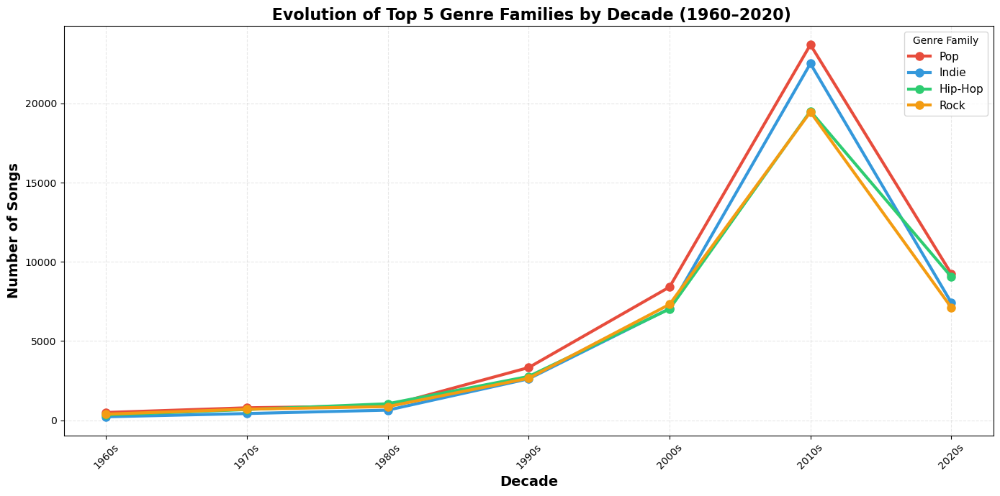

GENRE FAMILY TREND SUMMARY

Pop:
  First appearance: 1960s
  Peak decade:      2010s (23,702 songs)
  2020s count:      9,256 songs
  Overall growth:   +1769.9%

Indie:
  First appearance: 1960s
  Peak decade:      2010s (22,513 songs)
  2020s count:      7,433 songs
  Overall growth:   +3233.2%

Hip-Hop:
  First appearance: 1960s
  Peak decade:      2010s (19,514 songs)
  2020s count:      9,057 songs
  Overall growth:   +2595.5%

Rock:
  First appearance: 1960s
  Peak decade:      2010s (19,458 songs)
  2020s count:      7,123 songs
  Overall growth:   +1726.4%


In [15]:
#time line plot
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

#load and preprocess 
df = pd.read_csv('../data/songs.csv')
df = df.dropna(subset=['Name', 'Release'])

if 'Valeance' in df.columns:
    df = df.rename(columns={'Valeance': 'Valence'})

#convert release to datetime and extract year
df['Release'] = pd.to_datetime(df['Release'], errors='coerce')
df['Year'] = df['Release'].dt.year
df = df.dropna(subset=['Year'])
df['Year'] = df['Year'].astype(int)

#map genres to broader families
genre_families = {
    'rock': 'Rock', 'metal': 'Metal', 'pop': 'Pop',
    'rap': 'Hip-Hop', 'hip hop': 'Hip-Hop', 'trap': 'Hip-Hop',
    'electronic': 'Electronic', 'house': 'Electronic', 'techno': 'Electronic',
    'edm': 'Electronic', 'trance': 'Electronic',
    'jazz': 'Jazz', 'classical': 'Classical', 'folk': 'Folk',
    'indie': 'Indie', 'blues': 'Blues', 'reggae': 'Reggae',
    'punk': 'Punk', 'soul': 'Soul', 'funk': 'Funk', 'country': 'Country'
}

def map_to_family(genre):
    if pd.isna(genre):
        return 'Other'
    genre = str(genre).lower()
    for keyword, family in genre_families.items():
        if keyword in genre:
            return family
    return 'Other'

df['GenreFamily'] = df['Genre'].apply(map_to_family)

#create decade column
df['Decade'] = (df['Year'] // 10) * 10

#filter to valid decades
df_filtered = df[(df['Decade'] >= 1960) & (df['Decade'] <= 2020)].copy()

#top 5 genre families
top_families = df_filtered['GenreFamily'].value_counts().head(5).index.tolist()
top_families = [fam for fam in top_families if fam != 'Other']

#count songs per decade per family
decade_counts = df_filtered[df_filtered['GenreFamily'].isin(top_families)] \
    .groupby(['Decade', 'GenreFamily']).size().unstack(fill_value=0)

#plot
fig, ax = plt.subplots(figsize=(14, 7))
colors = ['#e74c3c', '#3498db', '#2ecc71', '#f39c12', '#9b59b6']
for i, family in enumerate(top_families):
    ax.plot(decade_counts.index, decade_counts[family],
            marker='o', linewidth=3, markersize=8,
            label=family, color=colors[i])

#style
ax.set_xlabel('Decade', fontsize=14, fontweight='bold')
ax.set_ylabel('Number of Songs', fontsize=14, fontweight='bold')
ax.set_title(' Evolution of Top 5 Genre Families by Decade (1960–2020)', fontsize=16, fontweight='bold')
ax.set_xticks(decade_counts.index)
ax.set_xticklabels([f"{int(d)}s" for d in decade_counts.index], rotation=45)
ax.legend(title='Genre Family', fontsize=11)
ax.grid(alpha=0.3, linestyle='--')

plt.tight_layout()
plt.show()

#optional summary

print("GENRE FAMILY TREND SUMMARY")

for family in top_families:
    first_decade = decade_counts[family][decade_counts[family] > 0].index[0]
    peak_decade = decade_counts[family].idxmax()
    peak_count = decade_counts[family].max()
    recent_count = decade_counts[family].iloc[-1]
    
    print(f"\n{family}:")
    print(f"  First appearance: {int(first_decade)}s")
    print(f"  Peak decade:      {int(peak_decade)}s ({peak_count:,} songs)")
    print(f"  2020s count:      {recent_count:,} songs")
    
    #trend analysis
    growth = ((recent_count - decade_counts[family].iloc[0]) / 
              decade_counts[family].iloc[0] * 100)
    print(f"  Overall growth:   {growth:+.1f}%")


In [ ]:
# feature importance analysis 
import matplotlib.pyplot as plt
import pickle
import pandas as pd
import numpy as np


#load trained model
with open('../models/genre_classifier.pkl', 'rb') as f:
    model = pickle.load(f)

print(f" Model loaded: {len(model.feature_importances_)} features")

#get built-in feature importance
feature_importance = pd.DataFrame({
    'feature': X_train.columns,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

#create visualization
fig, axes = plt.subplots(2, 2, figsize=(16, 10))

#plot 1:top 15 features
axes[0, 0].barh(feature_importance['feature'][:15], 
                feature_importance['importance'][:15],
                color='steelblue')
axes[0, 0].set_xlabel('Importance')
axes[0, 0].set_title('Top 15 Most Important Features', 
                      fontweight='bold', fontsize=12)
axes[0, 0].invert_yaxis()

#plot 2:all features (sorted)
axes[0, 1].bar(range(len(feature_importance)), feature_importance['importance'], 
               color='coral', alpha=0.7)
axes[0, 1].set_xlabel('Feature Rank')
axes[0, 1].set_ylabel('Importance')
axes[0, 1].set_title('All Features Importance Distribution', 
                      fontweight='bold', fontsize=12)
axes[0, 1].grid(alpha=0.3, axis='y')

#plot 3:cumulative importance
cumsum = feature_importance['importance'].cumsum()
axes[1, 0].plot(range(1, len(cumsum)+1), cumsum, linewidth=2, color='green')
axes[1, 0].axhline(y=0.5, color='blue', linestyle='--', alpha=0.5, label='50%')
axes[1, 0].axhline(y=0.8, color='red', linestyle='--', alpha=0.5, label='80%')
axes[1, 0].axhline(y=0.9, color='orange', linestyle='--', alpha=0.5, label='90%')
axes[1, 0].set_xlabel('Number of Features')
axes[1, 0].set_ylabel('Cumulative Importance')
axes[1, 0].set_title('Cumulative Feature Importance', 
                      fontweight='bold', fontsize=12)
axes[1, 0].grid(alpha=0.3)
axes[1, 0].legend()

#hide unused subplot (bottom right)
axes[1, 1].axis('off')

plt.tight_layout()
plt.show()

#summary text output
print("\n" + "="*70)
print("TOP 15 MOST IMPORTANT FEATURES:")
print("="*70)
print(f"{'Rank':<6}{'Feature':<35}{'Importance'}")
print("-"*70)

for i, (idx, row) in enumerate(feature_importance.head(15).iterrows(), 1):
    print(f"{i:<6}{row['feature']:<35}{row['importance']:.5f}")

print(f"\n{'='*70}")
print("FEATURE IMPORTANCE SUMMARY:")
print("="*70)
n_50 = (cumsum >= 0.5).argmax() + 1
n_80 = (cumsum >= 0.8).argmax() + 1
n_90 = (cumsum >= 0.9).argmax() + 1

print(f"   • Top feature: {feature_importance.iloc[0]['feature']} "
      f"({feature_importance.iloc[0]['importance']:.4f})")
print(f"   • {n_50} features explain 50% of model decisions")
print(f"   • {n_80} features explain 80% of model decisions")
print(f"   • {n_90} features explain 90% of model decisions")
print(f"   • Total features: {len(X_train.columns)}")

print("\n Feature importance analysis complete!")


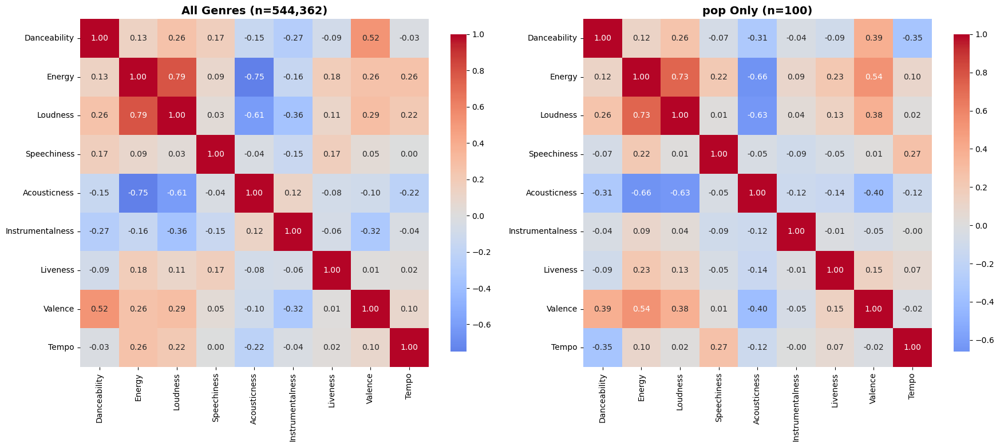

In [14]:
#genre correlation 

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


df_viz = pd.read_csv('../data/songs.csv')
df_viz = df_viz.dropna(subset=['Name', 'Release'])
df_viz = df_viz.rename(columns={'Valeance': 'Valence'})

#define audio features
audio_features = ['Danceability', 'Energy', 'Loudness', 'Speechiness', 
                  'Acousticness', 'Instrumentalness', 'Liveness', 'Valence', 'Tempo']

#pick a genre 
top_genre = df_viz['Genre'].value_counts().index[0]
df_genre = df_viz[df_viz['Genre'] == top_genre]

fig, axes = plt.subplots(1, 2, figsize=(18, 8))

#overall correlation
corr_all = df_viz[audio_features].corr()
sns.heatmap(corr_all, annot=True, fmt='.2f', cmap='coolwarm', 
            center=0, square=True, ax=axes[0], cbar_kws={"shrink": 0.8})
axes[0].set_title(f'All Genres (n={len(df_viz):,})', fontsize=14, fontweight='bold')

#genre-specific correlation
corr_genre = df_genre[audio_features].corr()
sns.heatmap(corr_genre, annot=True, fmt='.2f', cmap='coolwarm', 
            center=0, square=True, ax=axes[1], cbar_kws={"shrink": 0.8})
axes[1].set_title(f'{top_genre} Only (n={len(df_genre):,})', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

 Preparing ROC curve analysis...

Model knows 400 genres

Top 5 genres (by test set size):
  • accordeon: 20 test samples
  • acidcore: 20 test samples
  • action rock: 20 test samples
  • adoracion pentecostal: 20 test samples
  • alberta hip hop: 20 test samples


[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  37 tasks      | elapsed:    0.1s
[Parallel(n_jobs=2)]: Done 150 out of 150 | elapsed:    0.9s finished


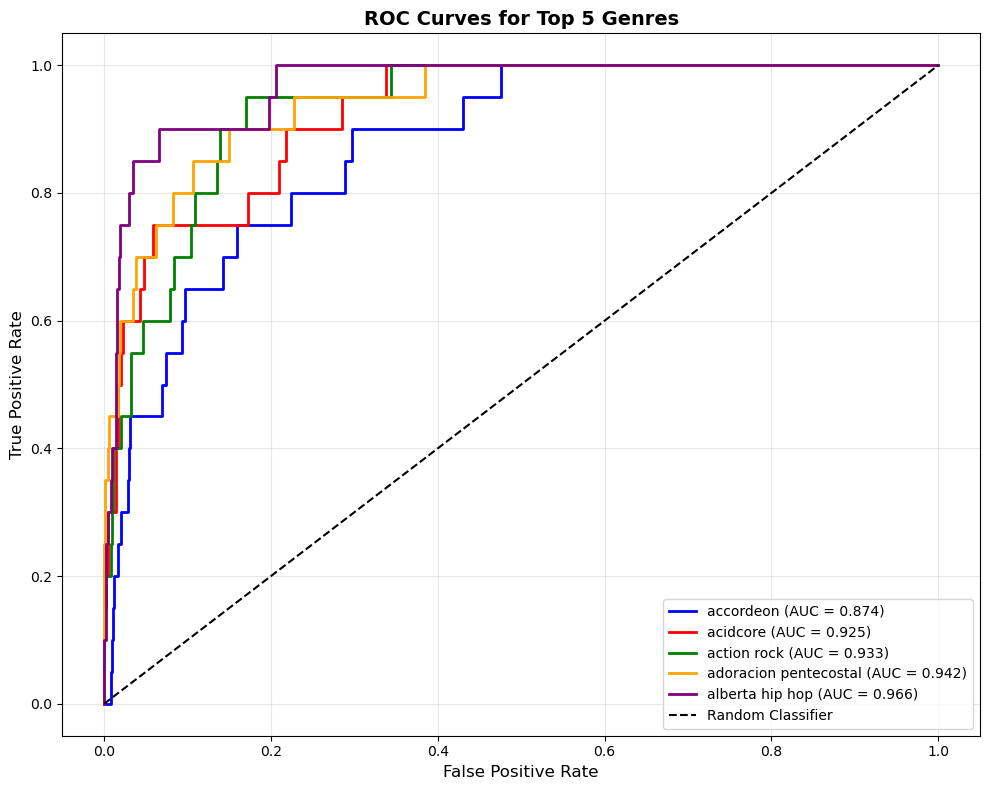


AUC SCORES FOR ALL GENRES (Top 20):
Rank  Genre                              AUC       Test Samples
----------------------------------------------------------------------
1     bangladeshi rock                   1.000     20
2     mallsoft                           0.999     20
3     spanish classical                  0.999     20
4     experimental club                  0.999     20
5     mexican son                        0.995     20
6     hard minimal techno                0.995     20
7     german pagan metal                 0.993     20
8     french black metal                 0.993     20
9     second line                        0.992     20
10    puglia indie                       0.991     20
11    german melodeath                   0.991     20
12    xhosa                              0.991     20
13    belgian dnb                        0.990     20
14    jewish hip hop                     0.990     20
15    rabindra sangeet                   0.989     20
16    russian heav

In [ ]:
#ROC Curves for top 5 genres 
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np

print(" Preparing ROC curve analysis...")

trained_genres = label_encoder.classes_
print(f"\nModel knows {len(trained_genres)} genres")

#find top 5 genres from training set
# count how many test samples we have for each genre
test_genre_counts = {}
for genre in trained_genres:
    count = (y_test == label_encoder.transform([genre])[0]).sum()
    test_genre_counts[genre] = count

# sort and get top 5
top_5_genres = sorted(test_genre_counts.items(), key=lambda x: -x[1])[:5]
top_5_genre_names = [g[0] for g in top_5_genres]
top_5_indices = [label_encoder.transform([g])[0] for g in top_5_genre_names]

print("\nTop 5 genres (by test set size):")
for genre, count in top_5_genres:
    print(f"  • {genre}: {count} test samples")

# binarize labels for ROC
y_test_bin = label_binarize(y_test, classes=np.arange(len(trained_genres)))
y_score = model.predict_proba(X_test_scaled)

# plot ROC curves
plt.figure(figsize=(10, 8))

colors = ['blue', 'red', 'green', 'orange', 'purple']

for i, (genre_idx, color) in enumerate(zip(top_5_indices, colors)):
    genre_name = trained_genres[genre_idx]
    fpr, tpr, _ = roc_curve(y_test_bin[:, genre_idx], y_score[:, genre_idx])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{genre_name} (AUC = {roc_auc:.3f})', 
             color=color, linewidth=2)

plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier', linewidth=1.5)
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title('ROC Curves for Top 5 Genres', fontsize=14, fontweight='bold')
plt.legend(loc='lower right', fontsize=10)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# additional analysis :show AUC for all genres
print("\n" + "="*70)
print("AUC SCORES FOR ALL GENRES (Top 20):")
print("="*70)

all_aucs = []
for i, genre_name in enumerate(trained_genres):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    test_count = (y_test == i).sum()
    all_aucs.append((genre_name, roc_auc, test_count))

#sort by AUC
all_aucs.sort(key=lambda x: -x[1])

print(f"{'Rank':<6}{'Genre':<35}{'AUC':<10}{'Test Samples'}")
print("-"*70)
for rank, (genre, auc_score, count) in enumerate(all_aucs[:20], 1):
    print(f"{rank:<6}{genre:<35}{auc_score:<10.3f}{count}")

print(f"\n{'='*70}")
print("SUMMARY STATISTICS:")
print("="*70)
auc_values = [x[1] for x in all_aucs]
print(f"   • Mean AUC: {np.mean(auc_values):.3f}")
print(f"   • Median AUC: {np.median(auc_values):.3f}")
print(f"   • Best AUC: {max(auc_values):.3f} ({all_aucs[0][0]})")
print(f"   • Worst AUC: {min(auc_values):.3f} ({all_aucs[-1][0]})")
print(f"   • Genres with AUC > 0.95: {sum(1 for x in auc_values if x > 0.95)}")
print(f"   • Genres with AUC > 0.90: {sum(1 for x in auc_values if x > 0.90)}")

print("\n ROC curve analysis complete!")

In [20]:
#rarest genres analysis

import pandas as pd
df = pd.read_csv('../data/songs.csv')
df = df.dropna(subset=['Genre'])
genre_counts = df['Genre'].value_counts()

#find minimum
min_count = genre_counts.min()
rarest_genres = genre_counts[genre_counts == min_count]

print("="*70)
print(" RAREST GENRES IN DATASET")
print("="*70)

print(f"\nMinimum number of songs per genre: {min_count}\n")
print("Genres with this minimum count:")

for g in rarest_genres.index:
    print(f"  • {g}")

print(f"\nTotal number of genres with only {min_count} song(s): {len(rarest_genres)}")

# Show bottom 10 genres for context
print("\n" + "="*70)
print("BOTTOM 10 GENRES BY SONG COUNT")
print("="*70)
print(genre_counts.tail(10).to_string())


 RAREST GENRES IN DATASET

Minimum number of songs per genre: 24

Genres with this minimum count:
  • chip hop

Total number of genres with only 24 song(s): 1

BOTTOM 10 GENRES BY SONG COUNT
Genre
quatuor a cordes        38
dungeon synth           35
milwaukee indie         31
swedish folk pop        29
baroque violin          28
german post-hardcore    28
danish techno           28
baroque brass           28
muzica bisericeasca     25
chip hop                24
